In [1]:
%matplotlib inline
from pycocotools.coco import COCO
from pycocoevalcap.eval import COCOEvalCap
import matplotlib.pyplot as plt
import skimage.io as io
import pylab
pylab.rcParams['figure.figsize'] = (10.0, 8.0)

import json
from json import encoder
encoder.FLOAT_REPR = lambda o: format(o, '.3f')

In [2]:
# set up file names and pathes
dataDir='.'
dataType='val2014'
algName = 'fakecap'
annFile='%s/annotations/captions_%s.json'%(dataDir,dataType)
subtypes=['results', 'evalImgs', 'eval']
[resFile, evalImgsFile, evalFile]= \
['%s/results/captions_%s_%s_%s.json'%(dataDir,dataType,algName,subtype) for subtype in subtypes]

In [ ]:
# create coco object and cocoRes object
coco = COCO(annFile)
cocoRes = coco.loadRes(resFile)

loading annotations into memory...
0:00:02.120713
creating index...
[{u'image_id': 203564, u'id': 37, u'caption': u'A bicycle replica with a clock as the front wheel.'}]
[{u'image_id': 179765, u'id': 38, u'caption': u'A black Honda motorcycle parked in front of a garage.'}]
[{u'image_id': 322141, u'id': 49, u'caption': u'A room with blue walls and a white sink and door.'}]
[{u'image_id': 16977, u'id': 89, u'caption': u'A car that seems to be parked illegally behind a legally parked car'}]
[{u'image_id': 106140, u'id': 98, u'caption': u'A large passenger airplane flying through the air.'}]
[{u'image_id': 106140, u'id': 98, u'caption': u'A large passenger airplane flying through the air.'}, {u'image_id': 106140, u'id': 101, u'caption': u'There is a GOL plane taking off in a partly cloudy sky.'}]
[{u'image_id': 322141, u'id': 49, u'caption': u'A room with blue walls and a white sink and door.'}, {u'image_id': 322141, u'id': 109, u'caption': u'Blue and white color scheme in a small bathroo

In [ ]:
# create cocoEval object by taking coco and cocoRes
cocoEval = COCOEvalCap(coco, cocoRes)

# evaluate on a subset of images by setting
# cocoEval.params['image_id'] = cocoRes.getImgIds()
# please remove this line when evaluating the full validation set
cocoEval.params['image_id'] = cocoRes.getImgIds()

# evaluate results
cocoEval.evaluate()

In [6]:
# print output evaluation scores
for metric, score in cocoEval.eval.items():
    print '%s: %.3f'%(metric, score)

CIDEr: 0.600
Bleu_4: 0.191
Bleu_3: 0.279
Bleu_2: 0.404
Bleu_1: 0.579
ROUGE_L: 0.396
METEOR: 0.195


In [7]:
# demo how to use evalImgs to retrieve low score result
evals = [eva for eva in cocoEval.evalImgs if eva['CIDEr']<30]
print 'ground truth captions'
imgId = evals[0]['image_id']
annIds = coco.getAnnIds(imgIds=imgId)
anns = coco.loadAnns(annIds)
coco.showAnns(anns)

print '\n'
print 'generated caption (CIDEr score %0.1f)'%(evals[0]['CIDEr'])
annIds = cocoRes.getAnnIds(imgIds=imgId)
anns = cocoRes.loadAnns(annIds)
coco.showAnns(anns)

img = coco.loadImgs(imgId)[0]
I = io.imread('%s/images/%s/%s'%(dataDir,dataType,img['file_name']))
plt.imshow(I)
plt.axis('off')
plt.show()

ground truth captions
A train traveling down tracks next to lights.
A blue and silver train next to train station and trees.
A blue train is next to a sidewalk on the rails.
A passenger train pulls into a train station.
A train coming down the tracks arriving at a station.


generated caption (CIDEr score 1.0)
train traveling down a track in front of a road


IOError: [Errno 2] No such file or directory: u'./images/val2014/COCO_val2014_000000184321.jpg'

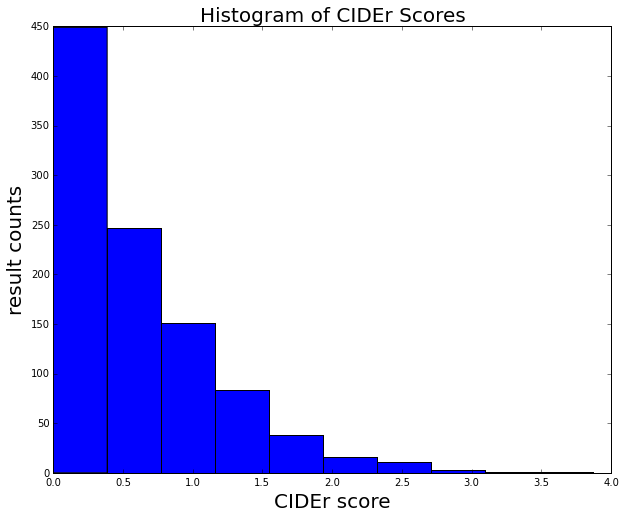

In [7]:
# plot score histogram
ciderScores = [eva['CIDEr'] for eva in cocoEval.evalImgs]
plt.hist(ciderScores)
plt.title('Histogram of CIDEr Scores', fontsize=20)
plt.xlabel('CIDEr score', fontsize=20)
plt.ylabel('result counts', fontsize=20)
plt.show()

In [8]:
# save evaluation results to ./results folder
json.dump(cocoEval.evalImgs, open(evalImgsFile, 'w'))
json.dump(cocoEval.eval,     open(evalFile, 'w'))